<a href="https://colab.research.google.com/github/illegallyCrushed/UKPetra-Huawei-Certified-ICT-Associate-AI-Track-2021/blob/master/Rebar_Count_Detection_UKPetra.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# import pytorch ver 1.4.0 and pycocotools

%pip install torch==1.4.0 torchvision==0.5.0 -f https://download.pytorch.org/whl/torch_stable.html
%pip install pycocotools
import torch
import torchvision
import pycocotools.cocoeval
if torch.__version__.count("1.4.0") == 0:
    print("This code uses pytorch 1.4.0!")
    assert False

DEVICE = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

Looking in links: https://download.pytorch.org/whl/torch_stable.html


In [2]:
# download training and test data

import os
import requests
import zipfile
import shutil

if not os.path.exists('./rebar_count_datasets'):
    print('Downloading code and datasets...')
    url = 'https://cnnorth4-modelhub-datasets-obsfs-sfnua.obs.cn-north-4.myhuaweicloud.com/content/c2c1853f-d6a6-4c9d-ac0e-203d4c304c88/NkxX5K/dataset/rebar_count_datasets.zip'
    r = requests.get(url, allow_redirects=True)
    open('./rebar_count_datasets.zip', 'wb').write(r.content)

    with zipfile.ZipFile('./rebar_count_datasets.zip', 'r') as zip_ref:
        zip_ref.extractall('./')

    if os.path.exists('./v0.6.0.zip'):
        os.remove('./v0.6.0.zip')

    if os.path.exists('./rebar_count_datasets'):
         print('Download code and datasets success')
    else:
         print('Download code and datasets failed, please check the download url is valid or not.')
else:
    print('./rebar_count_datasets already exists')

Download code and datasets success


In [3]:
# downloading pytorch vision coco helper

url = 'https://github.com/pytorch/vision/archive/refs/tags/v0.6.0.zip'
r = requests.get(url, allow_redirects=True)
open('./v0.6.0.zip', 'wb').write(r.content)

with zipfile.ZipFile('./v0.6.0.zip', 'r') as zip_ref:
    zip_ref.extractall('./')

if os.path.exists('./v0.6.0.zip'):
    os.remove('./v0.6.0.zip')

shutil.copyfile("./vision-0.6.0/references/detection/utils.py", "./utils.py")
shutil.copyfile("./vision-0.6.0/references/detection/transforms.py", "./transforms.py")
shutil.copyfile("./vision-0.6.0/references/detection/coco_eval.py", "./coco_eval.py")
shutil.copyfile("./vision-0.6.0/references/detection/engine.py", "./engine.py")
shutil.copyfile("./vision-0.6.0/references/detection/coco_utils.py", "./coco_utils.py")

import transforms as T

def get_transform(train):
    transforms = []
    transforms.append(T.ToTensor())
    if train:
        transforms.append(T.RandomHorizontalFlip(0.5))
    return T.Compose(transforms)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:45: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:47: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


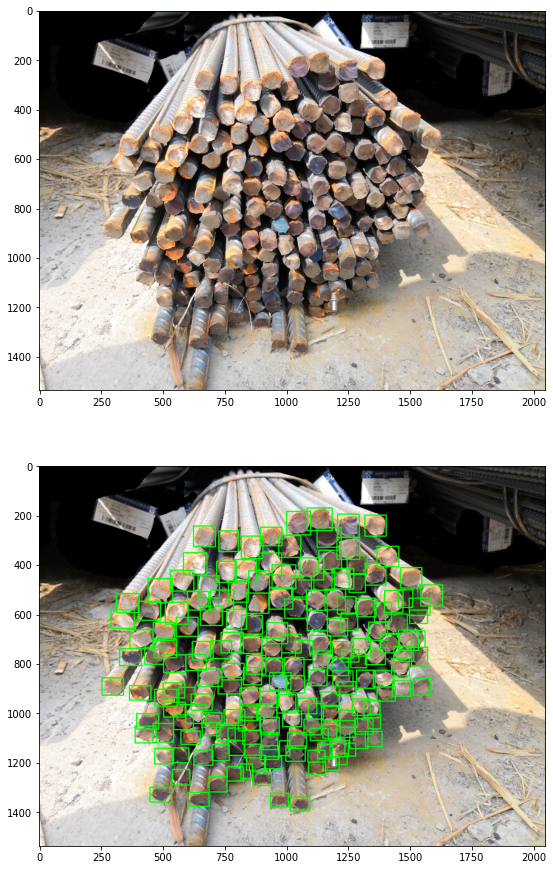

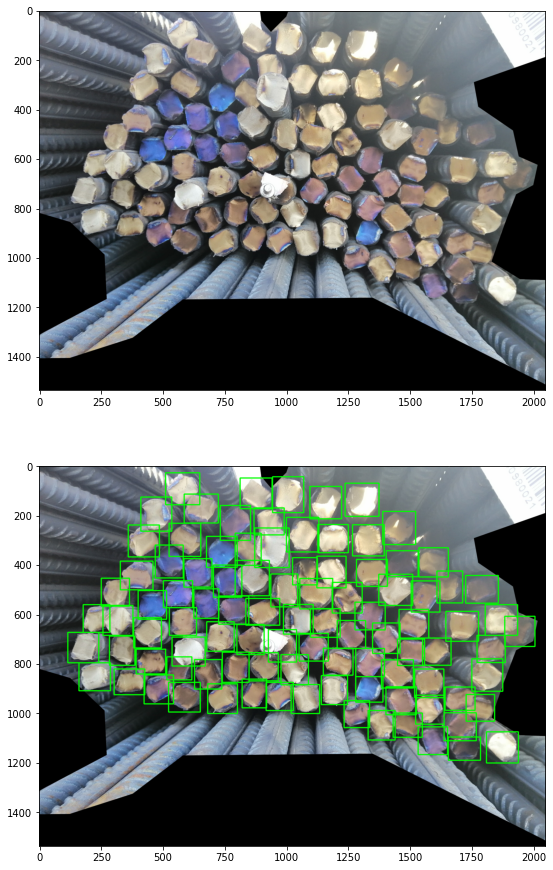

In [4]:
# inspecting dataset

import xml.etree.ElementTree as ET
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import cv2

def read_xml(xml_path):
    tree = ET.parse(xml_path)
    root = tree.getroot()
    boxes = []
    labels = []
    for element in root.findall('object'):
        label = element.find('name').text
        if label == 'steel':
            bndbox = element.find('bndbox')
            xmin = bndbox.find('xmin').text
            ymin = bndbox.find('ymin').text
            xmax = bndbox.find('xmax').text
            ymax = bndbox.find('ymax').text
            boxes.append([xmin, ymin, xmax, ymax])
            labels.append(label)
    return np.array(boxes, dtype=np.float64), labels

train_img_dir = './rebar_count_datasets/VOC2007/JPEGImages'
train_xml_dir = './rebar_count_datasets/VOC2007/Annotations'
files = os.listdir(train_img_dir)
files.sort()
for index, file_name in enumerate(files[:2]):
    img_path = os.path.join(train_img_dir, file_name)
    xml_path = os.path.join(train_xml_dir, file_name.split('.jpg')[0]+'.xml')
    boxes, labels = read_xml(xml_path)
    img = Image.open(img_path)
    resize_scale = 2048.0 / max(img.size)
    img = img.resize((int(img.size[0] * resize_scale), int(img.size[1] * resize_scale)))
    boxes *= resize_scale
    plt.figure(figsize=(img.size[0]/100.0, img.size[1]/100.0))
    plt.subplot(2,1,1)
    plt.imshow(img)
    img = img.convert('RGB')
    img = np.array(img)
    img = img.copy()
    for box in boxes:
        xmin, ymin, xmax, ymax = box.astype(np.int)
        cv2.rectangle(img, (xmin, ymin), (xmax, ymax), (0, 255, 0), thickness=3)
        plt.subplot(2,1,2)
        plt.imshow(img)
        
plt.show()

In [5]:
# creating pytorch dataset for rebar

class RebarDataset(torch.utils.data.Dataset):
    def __init__(self, root, transforms=None):
        self.root = root
        self.transforms = transforms
        self.imgs = list(sorted(os.listdir(os.path.join(root, "JPEGImages"))))
        
        if ".ipynb_checkpoints" in self.imgs:
            self.imgs.remove(".ipynb_checkpoints")

    def __getitem__(self, idx):
        img_path = os.path.join(self.root, "JPEGImages", self.imgs[idx])
        box_path = os.path.join(self.root, "Annotations", self.imgs[idx].split(".")[0]+'.xml')
        img = Image.open(img_path).convert("RGB")
        boxes,_ = read_xml(box_path)

        boxes = torch.as_tensor(boxes, dtype=torch.float32 , device = DEVICE)
        labels = torch.ones((len(boxes),), dtype=torch.int64 , device = DEVICE)
        
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
        iscrowd = torch.zeros((len(boxes),), dtype=torch.int64)

        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["image_id"] = torch.tensor([idx], device = DEVICE)
        target["area"] = area
        target["iscrowd"] = iscrowd

        if self.transforms is not None:
            img, target = self.transforms(img, target)

        return img, target

    def __len__(self):
        return len(self.imgs)

In [6]:
# load faster rcnn model pretrained with resnet50 backbone

from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

model = torchvision.models.detection.fasterrcnn_resnet50_fpn(
    pretrained=True,
    progress=True,
)

num_classes = 2  # 1 rebar + background
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes) 
model.roi_heads.detections_per_img=500 # max object detection
pycocotools.cocoeval.Params.setDetParams.maxDets = [5, 50, 500]
model.to(DEVICE)


Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth


  0%|          | 0.00/160M [00:00<?, ?B/s]

FasterRCNN(
  (transform): GeneralizedRCNNTransform()
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d()
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d()
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d()
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d()
          (relu): ReLU(inplace=True)
          (downsample): Sequential(
            (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
            (1): FrozenBatchNorm2d()
          )
  

In [7]:
# load dataset and split the dataset

train_dataset = RebarDataset("./rebar_count_datasets/VOC2007/",get_transform(True))
test_dataset = RebarDataset("./rebar_count_datasets/VOC2007/",get_transform(False))

indices = torch.randperm(len(train_dataset)).tolist()
# 80 - 20 split
train_dataset = torch.utils.data.Subset(train_dataset, indices[:-50]) #200
test_dataset = torch.utils.data.Subset(test_dataset, indices[-50:]) #50

# create data loaders

import utils

train_data_loader = torch.utils.data.DataLoader(
    train_dataset, batch_size=2, shuffle=True,
    collate_fn=utils.collate_fn)

test_data_loader = torch.utils.data.DataLoader(
    test_dataset, batch_size=1, shuffle=False,
    collate_fn=utils.collate_fn)

In [8]:
# create optimizer and learning rate scheduler

from torch.optim.lr_scheduler import StepLR

params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.Adam(params, lr=3e-4)
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer,
                                               step_size=1,
                                               gamma=0.06)

In [9]:
# train the model and save every epoch

from engine import train_one_epoch,evaluate

if os.path.exists("./model"):
    shutil.rmtree("./model")
os.makedirs("./model")
num_epochs = 4
model.to(DEVICE)

for epoch in range(num_epochs):

    # train for one epoch, printing every 10 iterations
    train_one_epoch(model, optimizer, train_data_loader, DEVICE, epoch, print_freq=10)
    # update the learning rate
    lr_scheduler.step()
    # evaluate on the test dataset
    evaluate(model, test_data_loader, device=DEVICE)
    
    path = os.path.join("./model", f'model_{epoch}.pth')
    torch.save(model.cpu().state_dict(), path) # saving model
	
	 # moving model to GPU for further training
    model.to(DEVICE)

Epoch: [0]  [  0/100]  eta: 0:04:12  lr: 0.000003  loss: 2.7676 (2.7676)  loss_classifier: 0.6939 (0.6939)  loss_box_reg: 0.3787 (0.3787)  loss_objectness: 1.5590 (1.5590)  loss_rpn_box_reg: 0.1361 (0.1361)  time: 2.5217  data: 1.4991  max mem: 3697
Epoch: [0]  [ 10/100]  eta: 0:02:16  lr: 0.000034  loss: 1.0845 (1.5250)  loss_classifier: 0.5538 (0.5753)  loss_box_reg: 0.3230 (0.3130)  loss_objectness: 0.1654 (0.5136)  loss_rpn_box_reg: 0.1193 (0.1231)  time: 1.5202  data: 0.8975  max mem: 4257
Epoch: [0]  [ 20/100]  eta: 0:01:58  lr: 0.000064  loss: 0.9274 (1.1352)  loss_classifier: 0.3655 (0.4151)  loss_box_reg: 0.2705 (0.2836)  loss_objectness: 0.1171 (0.3162)  loss_rpn_box_reg: 0.1163 (0.1202)  time: 1.4347  data: 0.8612  max mem: 4257
Epoch: [0]  [ 30/100]  eta: 0:01:45  lr: 0.000094  loss: 0.5270 (0.9060)  loss_classifier: 0.1542 (0.3179)  loss_box_reg: 0.2052 (0.2420)  loss_objectness: 0.0484 (0.2294)  loss_rpn_box_reg: 0.1119 (0.1167)  time: 1.4950  data: 0.9152  max mem: 4257


Loading model from ./model/model_3.pth


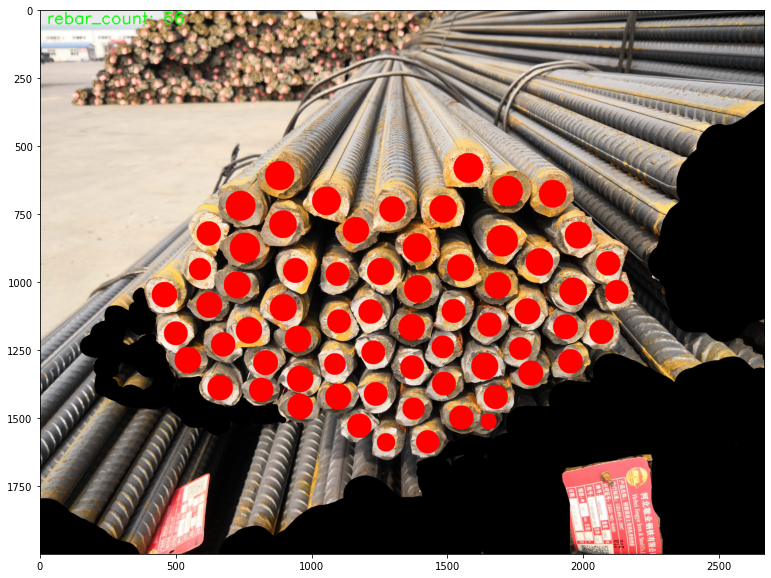

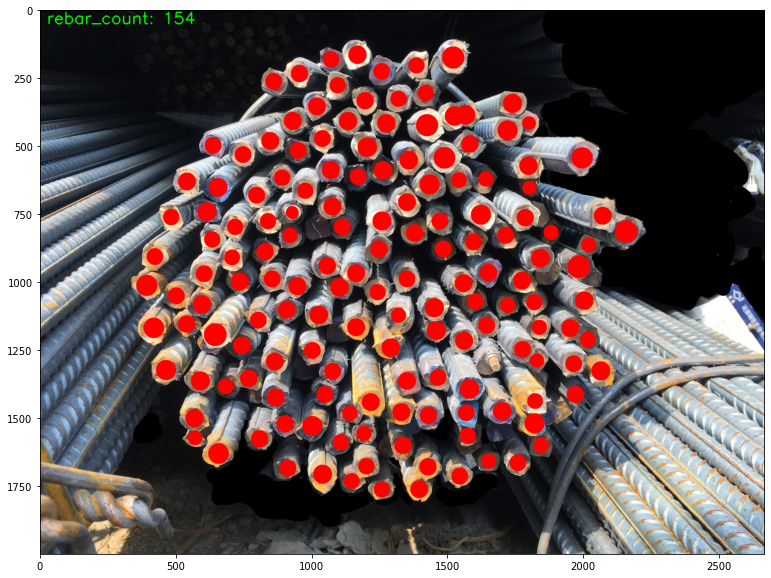

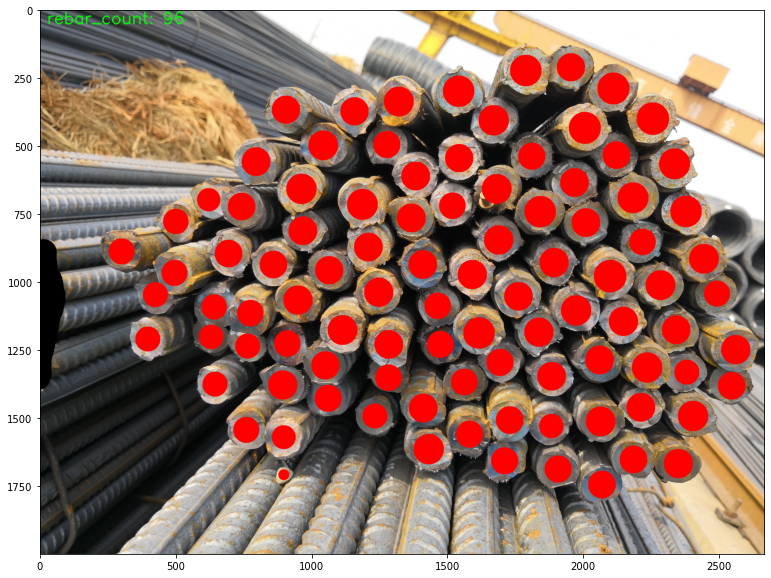

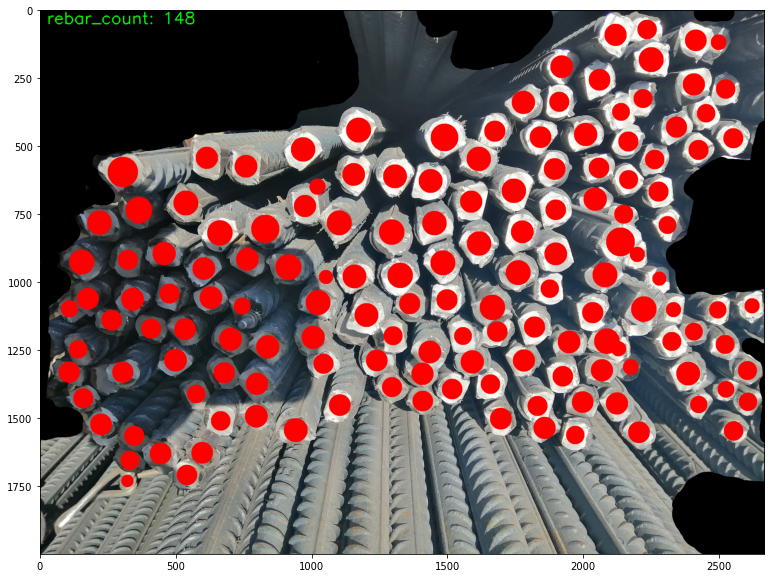

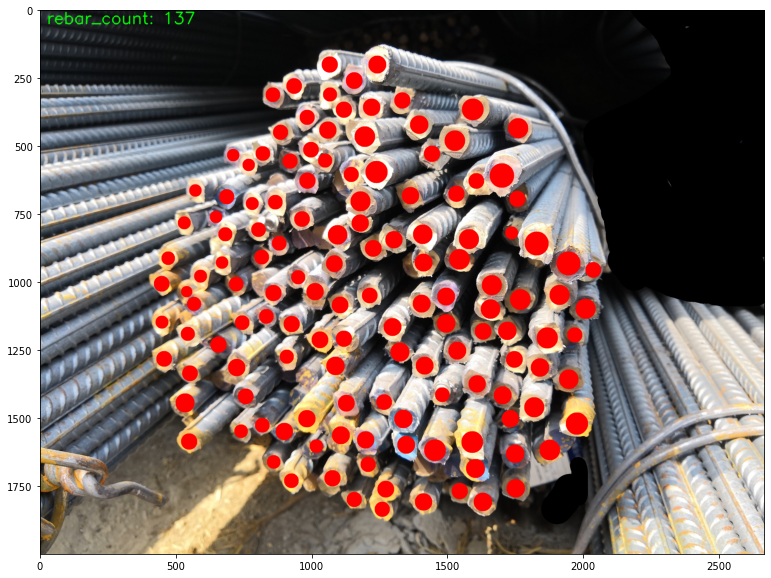

...

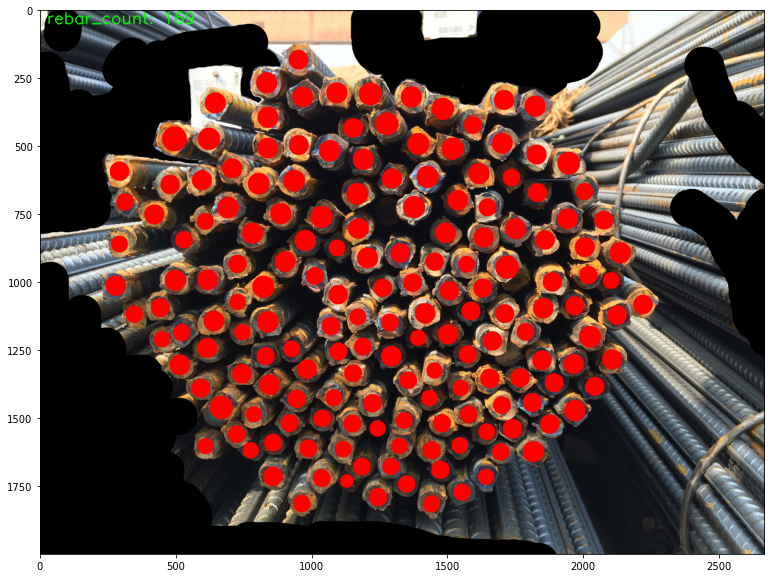

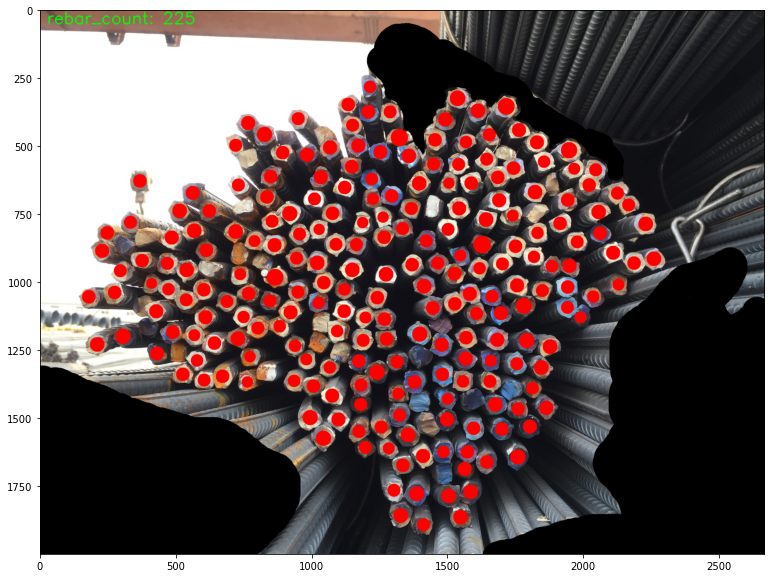

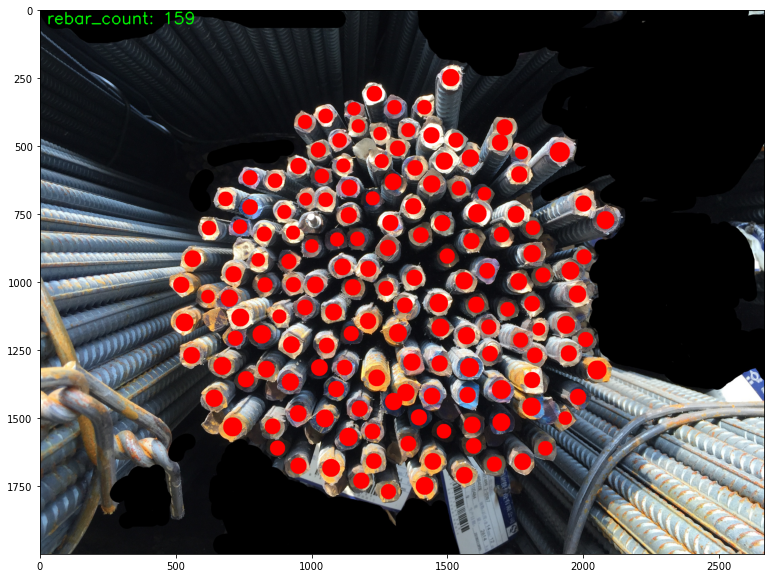

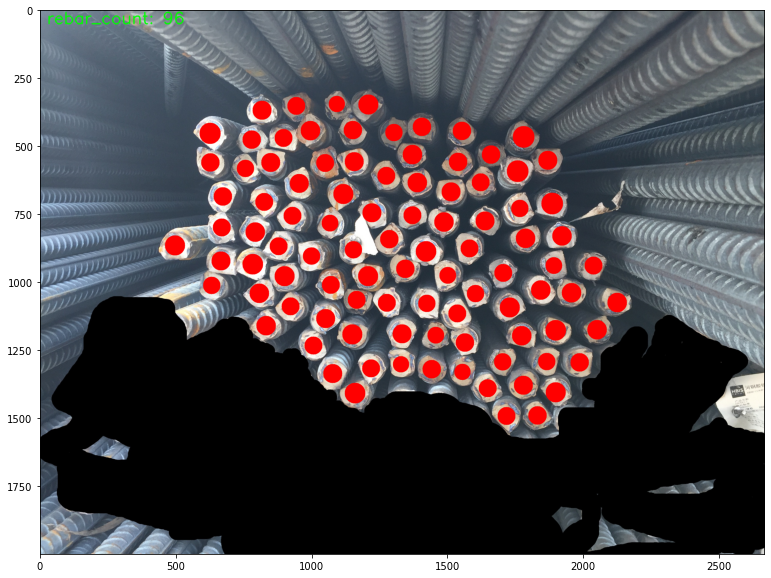

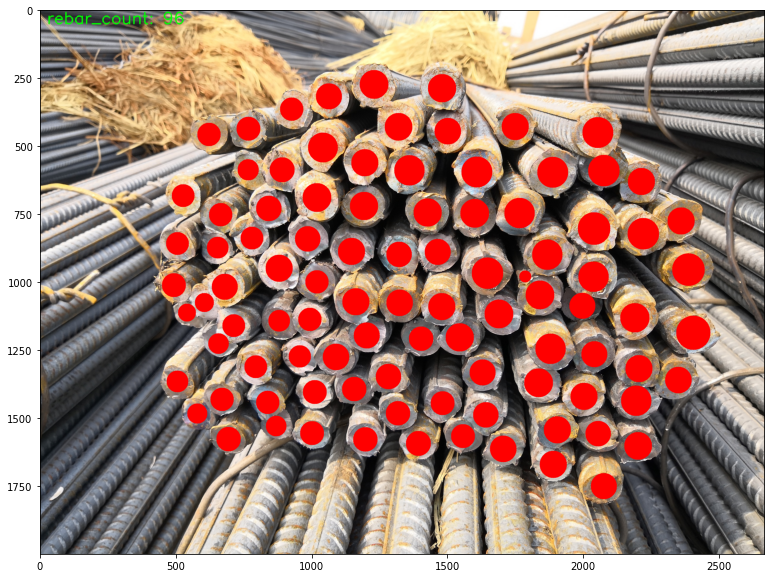

In [10]:
# load last epoch

import torch
if torch.__version__.count("1.4.0") == 0:
    print("This code uses pytorch 1.4.0!")
    assert False
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
import os
from PIL import Image, ImageDraw
import numpy
import matplotlib.pyplot as plt
import cv2
import random

DEVICE = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

num_classes = 2  # 1 rebar + background
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(
    pretrained=True,
    progress=True,
)

in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes) 
model.roi_heads.detections_per_img=500 # max object detection
model.to(DEVICE)

trained_models = os.listdir('./model')
latest_epoch = -1
for model_name in trained_models:
    if not model_name.endswith('pth'):
        continue
    epoch = float(model_name.split('_')[1].split('.pth')[0])
    if epoch > latest_epoch:
        latest_epoch = epoch
        best_model_name = model_name
best_model_path = os.path.join('./model', best_model_name)
print('Loading model from', best_model_path)

model.load_state_dict(torch.load(best_model_path))
model.eval()

test_img_dir = r'./rebar_count_datasets/test_dataset'
files = os.listdir(test_img_dir)
random.shuffle(files)
if ".ipynb_checkpoints" in files:
    files.remove(".ipynb_checkpoints")
for i, file_name in enumerate(files[:15]):
    image_src = Image.open(os.path.join(test_img_dir, file_name)).convert("RGB")
    img_tensor = torchvision.transforms.ToTensor()(image_src)
    img_tensor
    with torch.no_grad():
        result_dict = model([img_tensor.to(DEVICE)])
    bbox = result_dict[0]["boxes"].cpu().numpy()
    scrs = result_dict[0]["scores"].cpu().numpy()

    image_draw = numpy.array(image_src.copy())
   
    rebar_count = 0
    for bbox,scr in zip(bbox,scrs):
        if len(bbox) > 0:
            if scr > 0.65:
                pt = bbox
                cv2.circle(image_draw, (int((pt[0] + pt[2]) * 0.5), int((pt[1] + pt[3]) * 0.5)), int((pt[2] - pt[0]) * 0.5 * 0.6), (255, 0, 0), -1)
                rebar_count += 1
    cv2.putText(image_draw, 'rebar_count: %d' % rebar_count, (25, 50), cv2.FONT_HERSHEY_SIMPLEX, 2, (0, 255, 0), 3)
    plt.figure(i, figsize=(15, 10))
    plt.imshow(image_draw)
    plt.show()